<a href="https://colab.research.google.com/github/PacktPublishing/Hands-On-Computer-Vision-with-PyTorch/blob/master/Chapter12/face_generation_using_conditional_gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!wget https://www.dropbox.com/s/kycxk2xe0p667f1/kaggle.json
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d jessicali9530/celeba-dataset/
!unzip -qq celeba-dataset.zip
!rm celeba-dataset.zip

--2020-10-04 10:25:08--  https://www.dropbox.com/s/kycxk2xe0p667f1/kaggle.json
Resolving www.dropbox.com (www.dropbox.com)... 162.125.9.1, 2620:100:601f:1::a27d:901
Connecting to www.dropbox.com (www.dropbox.com)|162.125.9.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/kycxk2xe0p667f1/kaggle.json [following]
--2020-10-04 10:25:09--  https://www.dropbox.com/s/raw/kycxk2xe0p667f1/kaggle.json
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc2e0cf903a0c40f5b8ceac3f1a1.dl.dropboxusercontent.com/cd/0/inline/BAmZoXlHN5y4ECQvr7XlxLFu4dexYQyirSNRfun_Ts6nanzheIRLGneLBMNb21r2BOgZB3uliWejvAdHbG05WLOxUsEE6BBsN9BbvohtcWmhutubc_N9DAxqATqCR53Xa0k/file# [following]
--2020-10-04 10:25:09--  https://uc2e0cf903a0c40f5b8ceac3f1a1.dl.dropboxusercontent.com/cd/0/inline/BAmZoXlHN5y4ECQvr7XlxLFu4dexYQyirSNRfun_Ts6nanzheIRLGneLBMNb21r2BOgZB3uliWejvAdHbG05WLOxUsEE6BBsN9BbvohtcWmhutubc_N9D

In [ ]:
!pip install -q --upgrade torch_snippets
from torch_snippets import *
import torchvision
from torchvision import transforms
import torchvision.utils as vutils
import cv2, numpy as np, pandas as pd
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

In [ ]:
device

'cuda'

In [ ]:
!mkdir img_align_celeba_cropped_faces
images = sorted(Glob('img_align_celeba/img_align_celeba/*'))
for i in range(100000):
    if(i%10000==0):
        print(i)
    img = read(images[i],1)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    for (x,y,w,h) in faces:
        img2 = img[y:(y+h),x:(x+w),:]
    cv2.imwrite('img_align_celeba_cropped_faces/'+images[i].split('/')[-1],cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))

2020-10-04 10:26:45.229 | INFO     | torch_snippets.loader:Glob:160 - 202599 files found at img_align_celeba/img_align_celeba/*


0
10000
20000
30000
40000
50000
60000
70000
80000
90000


In [ ]:
transform=transforms.Compose([
                               transforms.Resize(64),
                               transforms.CenterCrop(64),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

In [ ]:
data = pd.read_csv('list_attr_celeba.csv')
folder='img_align_celeba_cropped_faces/'

In [ ]:
class Celeba(Dataset):
    def __init__(self, folder, data):
        super().__init__()
        self.image_root = folder
        self.folder = folder
        self.data = data
    def __len__(self):
        return len(self.data)
    def __getitem__(self, ix):
        row = self.data.iloc[ix]
        image_path = f'{self.folder}/{row.image_id}'
        image = Image.open(image_path)
        image = transform(image)
        gender = row.Male == 1
        return image, torch.tensor(gender).long()

In [ ]:
ds = Celeba(folder='img_align_celeba_cropped_faces/', data=data.loc[:99999])
dataloader = DataLoader(ds, batch_size=64, shuffle=True, num_workers=8)

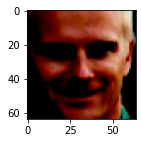

(None, tensor(1))

In [ ]:
k = 12
show(ds[k][0], grid=True), ds[k][1]

In [ ]:
'v1'
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

class Generator(nn.Module):
    def __init__(self, emb_size=32):
        super(Generator,self).__init__()
        self.emb_size = emb_size
        self.label_embeddings = nn.Embedding(2, self.emb_size)
        self.model = nn.Sequential(
            nn.ConvTranspose2d(100+self.emb_size,64*8,4,1,0,bias=False),
            nn.BatchNorm2d(64*8),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*8,64*4,4,2,1,bias=False),
            nn.BatchNorm2d(64*4),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*4,64*2,4,2,1,bias=False),
            nn.BatchNorm2d(64*2),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*2,64,4,2,1,bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64,3,4,2,1,bias=False),
            nn.Tanh()
        )
        self.apply(weights_init)
    def forward(self,input_noise,labels):
        label_embeddings = self.label_embeddings(labels).view(len(labels), self.emb_size, 1, 1)
        input = torch.cat([input_noise, label_embeddings], 1)
        return self.model(input)

class Discriminator(nn.Module):
    def __init__(self, emb_size=32):
        super(Discriminator, self).__init__()
        self.emb_size = 32
        self.label_embeddings = nn.Embedding(2, self.emb_size)
        self.model = nn.Sequential(
            nn.Conv2d(3,64,4,2,1,bias=False),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64,64*2,4,2,1,bias=False),
            nn.BatchNorm2d(64*2),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*2,64*4,4,2,1,bias=False),
            nn.BatchNorm2d(64*4),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*4,64*8,4,2,1,bias=False),
            nn.BatchNorm2d(64*8),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Conv2d(64*8,64,4,2,1,bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Flatten()
        )
        self.model2 = nn.Sequential(
            nn.Linear(288,100),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(100,1),
            nn.Sigmoid()
        )
        self.apply(weights_init)
    def forward(self, input, labels):
        #x = self.label_embeddings(labels).view(-1, 3, 64, 64)
        #input = input + x
        #input = torch.cat([input, x], 1)
        x = self.model(input)
        y = self.label_embeddings(labels)
        input = torch.cat([x, y], 1)
        final_output = self.model2(input)
        return final_output

def noise(size):
    n = torch.randn(size, 100, 1, 1, device=device)
    return n.to(device)



In [ ]:
def discriminator_train_step(real_data, real_labels, fake_data, fake_labels):
    # Reset gradients
    d_optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data, real_labels)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, torch.ones(len(real_data), 1).to(device))
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data, fake_labels)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, torch.zeros(len(fake_data), 1).to(device))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    d_optimizer.step()
    
    # Return error
    return error_real + error_fake

def generator_train_step(fake_data, fake_labels):
    # 2. Train Generator
    # Reset gradients
    g_optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data, fake_labels)
    # Calculate error and backpropagate
    error = loss(prediction, torch.ones(len(fake_data), 1).to(device))
    error.backward()
    # Update weights with gradients
    g_optimizer.step()
    # Return error
    return error

EPOCH: 1.000	d_loss: 0.471	g_loss: 4.579	(141.43s - 3394.27s remaining))


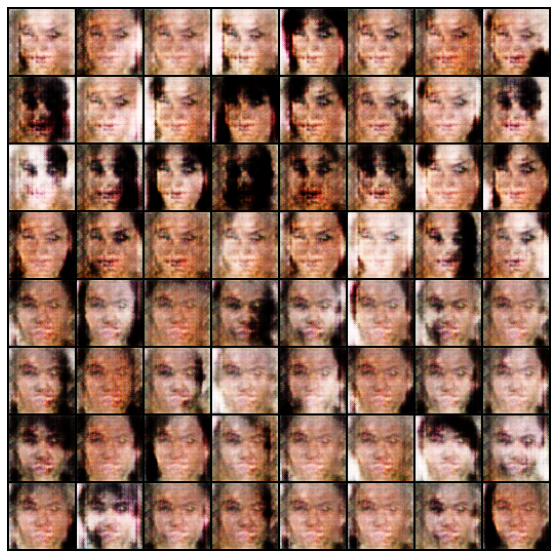

EPOCH: 2.000	d_loss: 0.398	g_loss: 5.931	(285.16s - 3279.31s remaining))


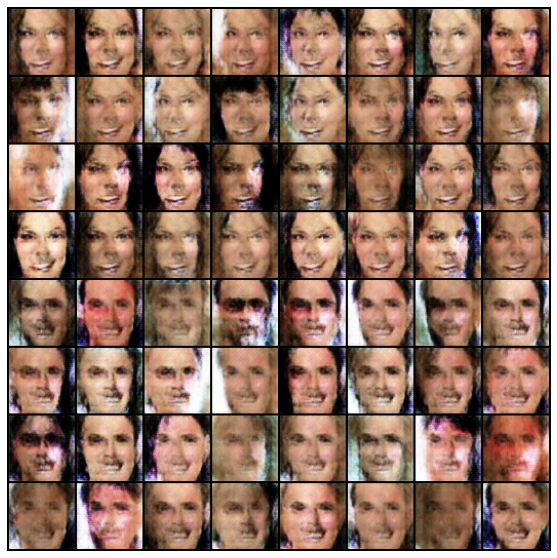

EPOCH: 3.000	d_loss: 0.345	g_loss: 6.187	(427.62s - 3135.86s remaining))


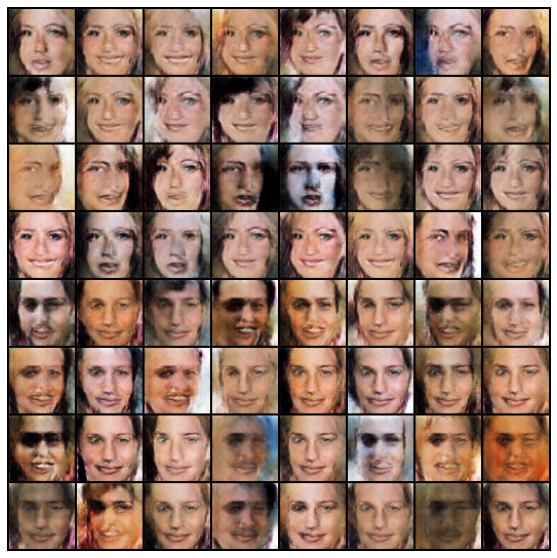

EPOCH: 4.000	d_loss: 0.373	g_loss: 5.691	(571.21s - 2998.83s remaining))


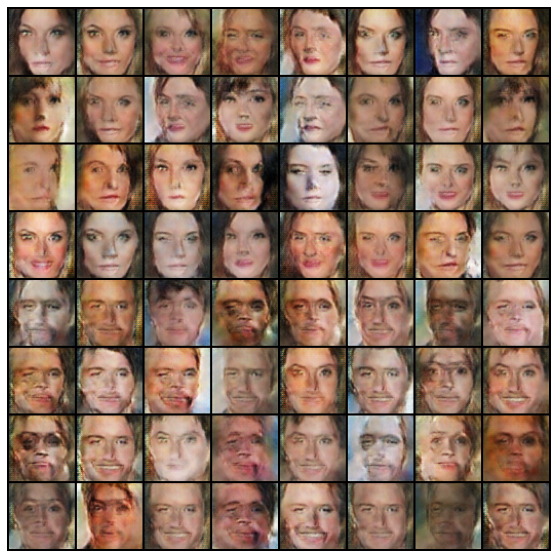

EPOCH: 5.000	d_loss: 0.441	g_loss: 4.797	(714.66s - 2858.64s remaining))


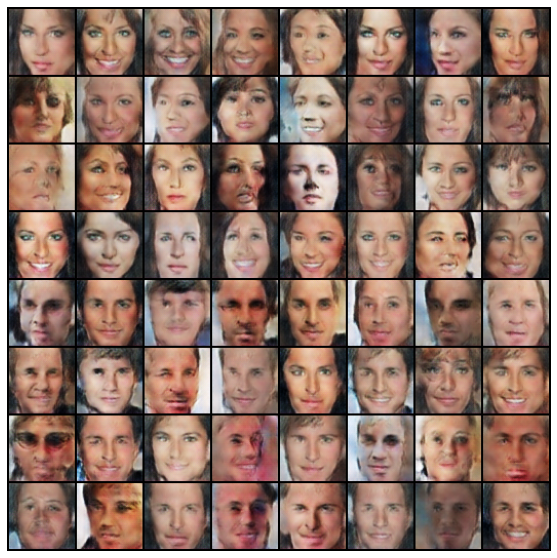

EPOCH: 6.000	d_loss: 0.467	g_loss: 4.402	(856.21s - 2711.32s remaining))


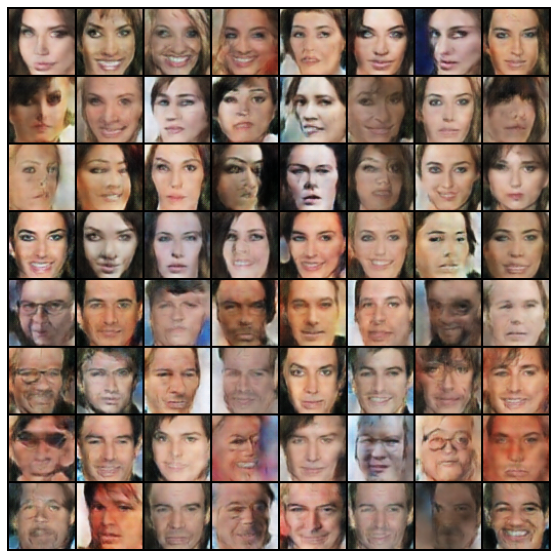

EPOCH: 7.000	d_loss: 0.466	g_loss: 4.186	(998.02s - 2566.32s remaining))


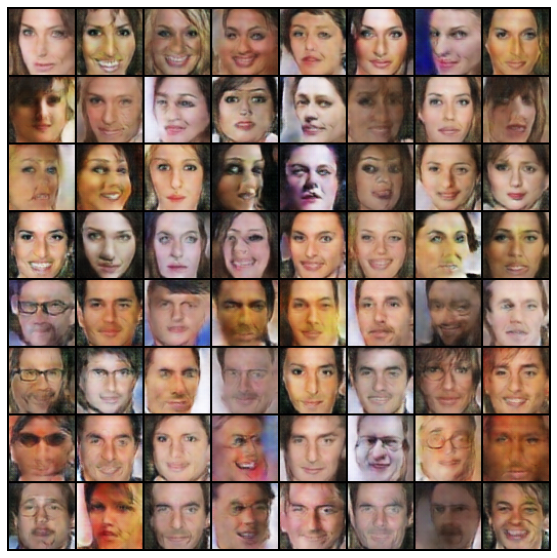

EPOCH: 8.000	d_loss: 0.446	g_loss: 4.117	(1137.73s - 2417.68s remaining))


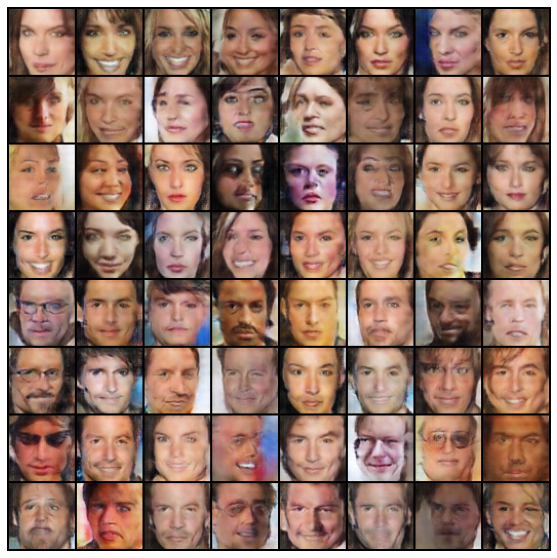

EPOCH: 9.000	d_loss: 0.437	g_loss: 4.136	(1277.11s - 2270.41s remaining))


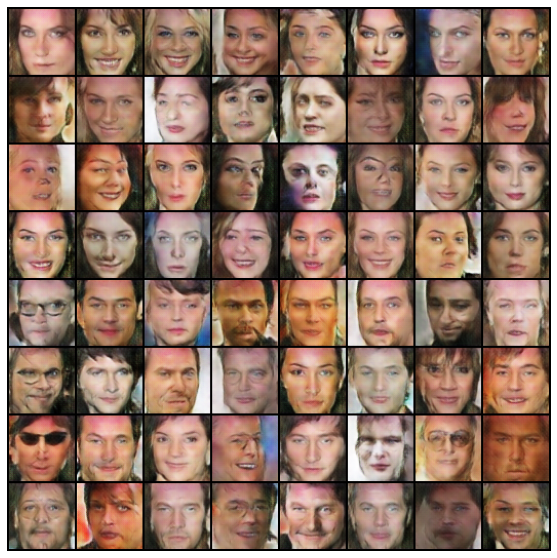

EPOCH: 10.000	d_loss: 0.425	g_loss: 4.124	(1419.37s - 2129.06s remaining)


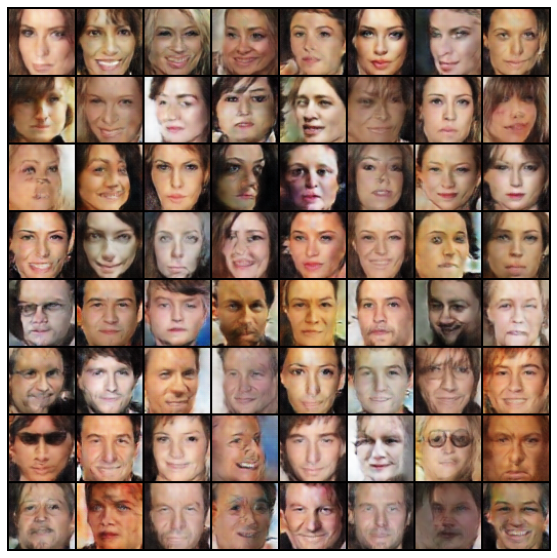

EPOCH: 11.000	d_loss: 0.435	g_loss: 3.986	(1561.43s - 1987.27s remaining))


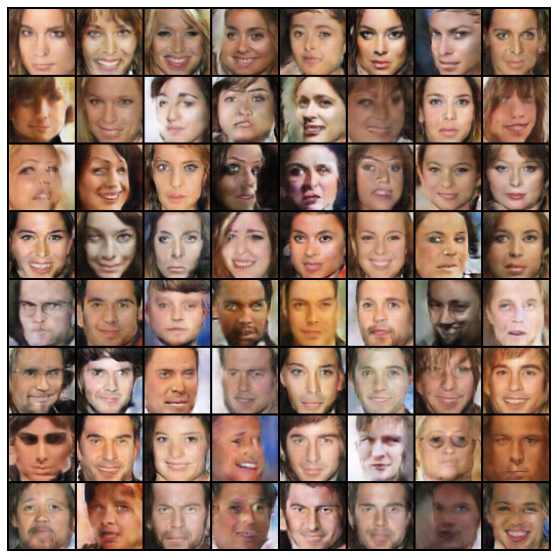

EPOCH: 12.000	d_loss: 0.405	g_loss: 4.092	(1704.44s - 1846.48s remaining))


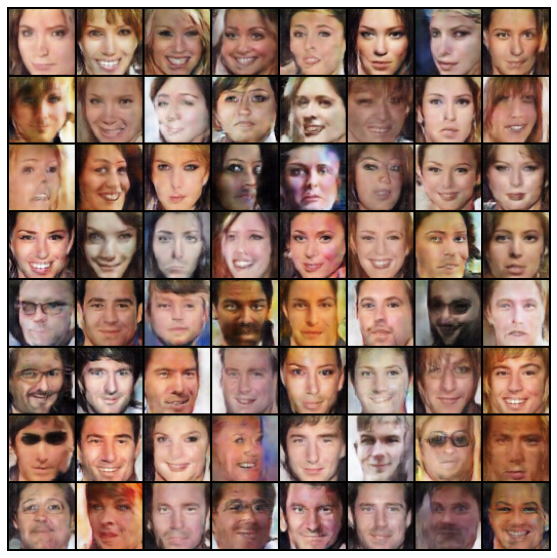

EPOCH: 13.000	d_loss: 0.369	g_loss: 4.177	(1847.20s - 1705.11s remaining)


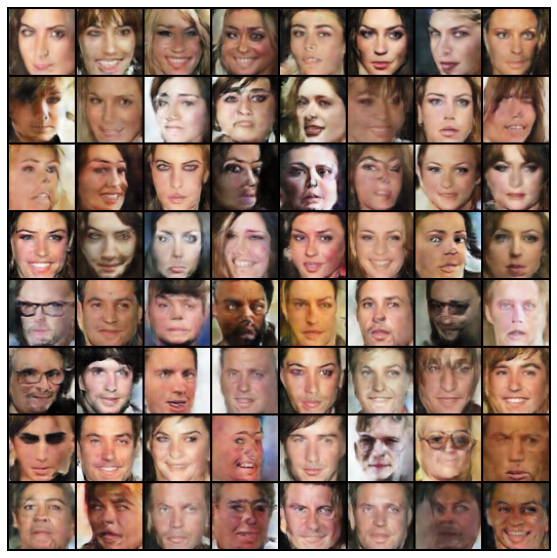

EPOCH: 14.000	d_loss: 0.387	g_loss: 4.037	(1990.08s - 1563.64s remaining)


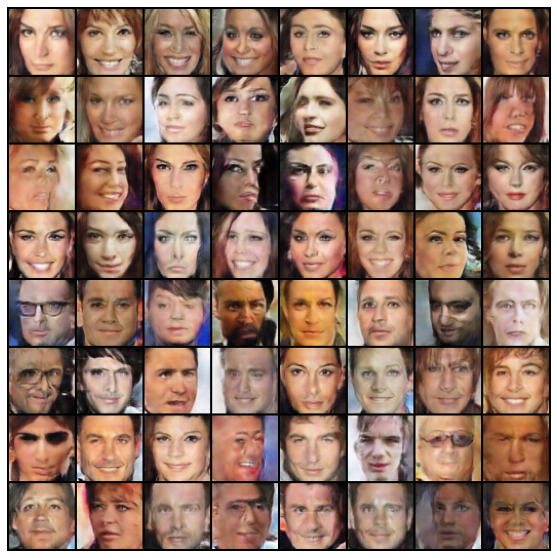

EPOCH: 15.000	d_loss: 0.386	g_loss: 4.052	(2133.65s - 1422.44s remaining))


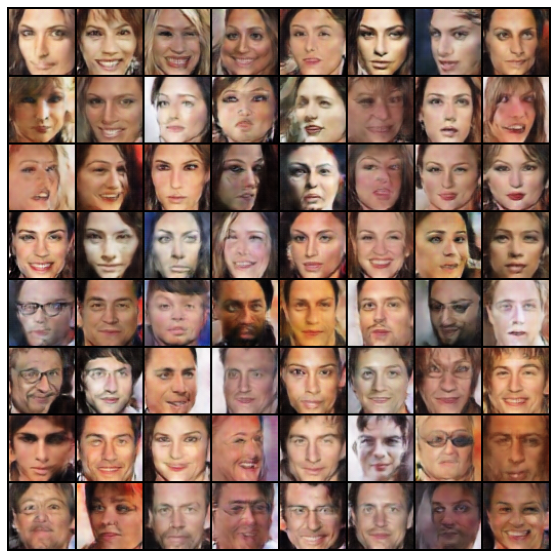

EPOCH: 16.000	d_loss: 0.356	g_loss: 4.191	(2275.70s - 1280.08s remaining))


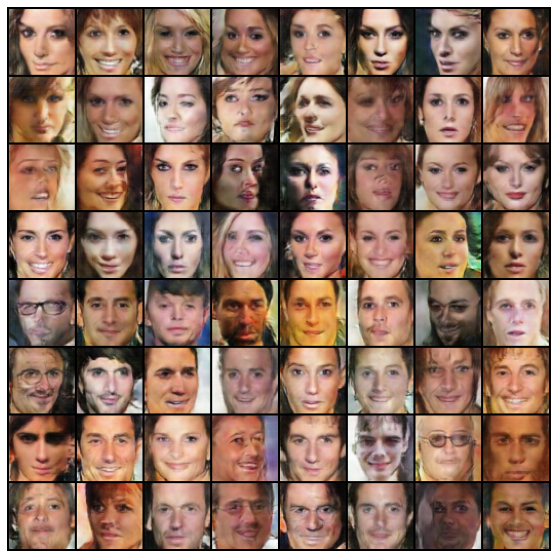

EPOCH: 17.000	d_loss: 0.351	g_loss: 4.157	(2416.90s - 1137.37s remaining))


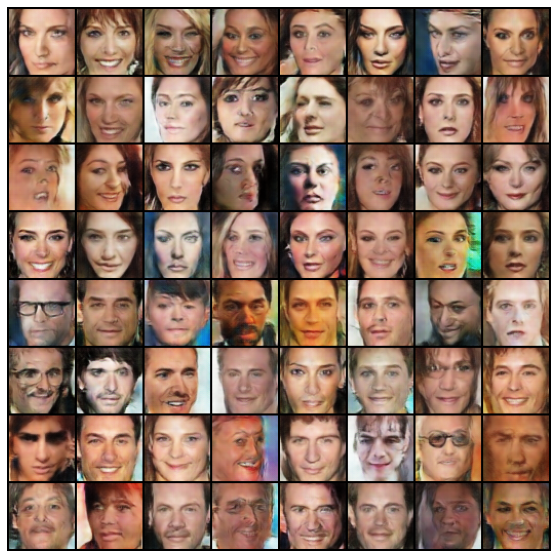

EPOCH: 18.000	d_loss: 0.357	g_loss: 4.066	(2562.90s - 996.68s remaining)))


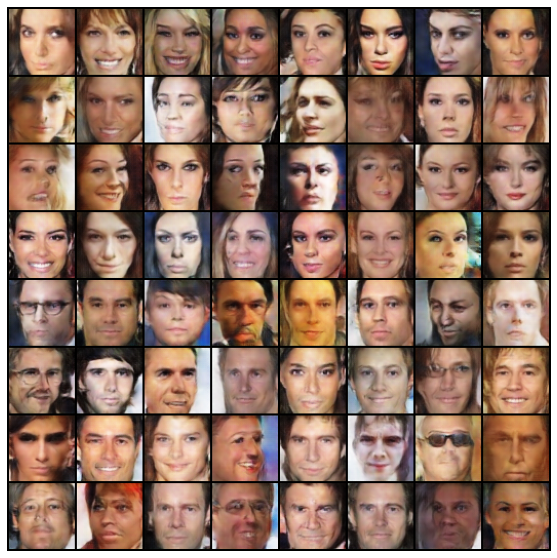

EPOCH: 19.000	d_loss: 0.321	g_loss: 4.168	(2704.64s - 854.10s remaining))


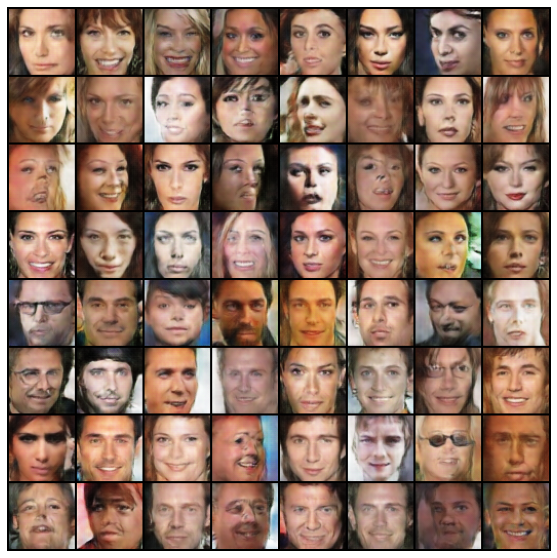

EPOCH: 20.000	d_loss: 0.349	g_loss: 4.061	(2847.07s - 711.77s remaining))


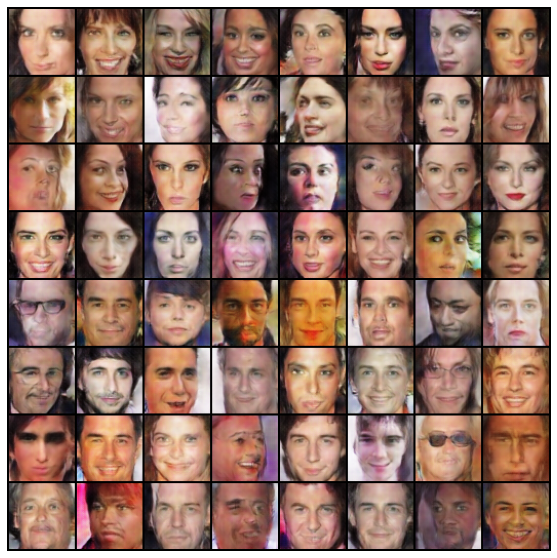

EPOCH: 21.000	d_loss: 0.344	g_loss: 4.034	(2989.37s - 569.40s remaining))


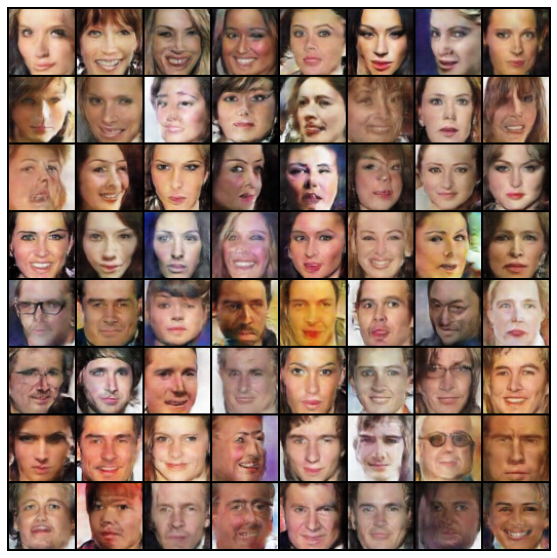

EPOCH: 22.000	d_loss: 0.318	g_loss: 4.207	(3131.04s - 426.96s remaining))


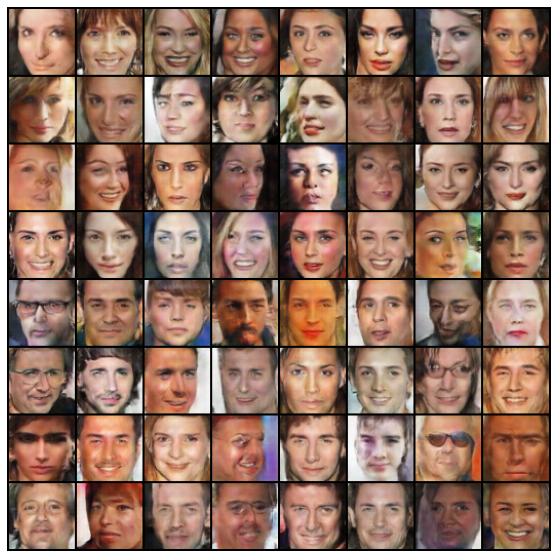

EPOCH: 23.000	d_loss: 0.285	g_loss: 4.362	(3273.80s - 284.68s remaining))


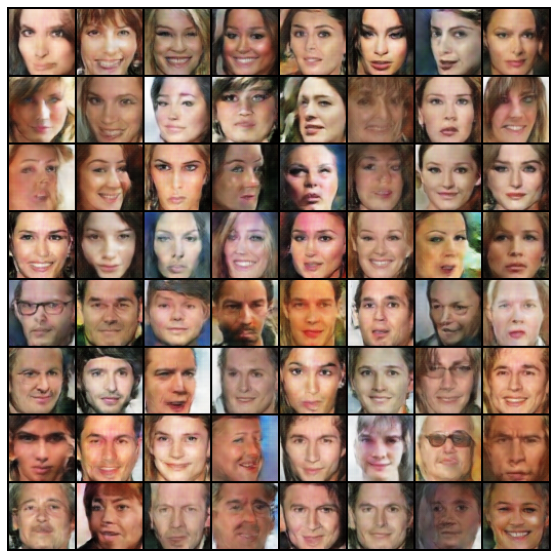

EPOCH: 24.000	d_loss: 0.316	g_loss: 4.170	(3414.74s - 142.28s remaining)


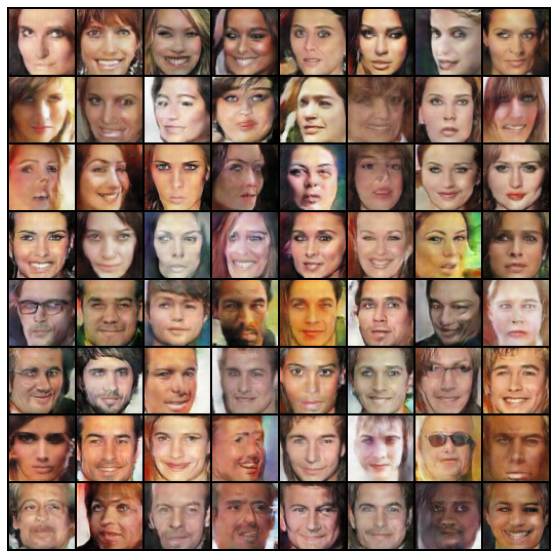

EPOCH: 25.000	d_loss: 0.294	g_loss: 4.277	(3556.35s - 0.00s remaining)))


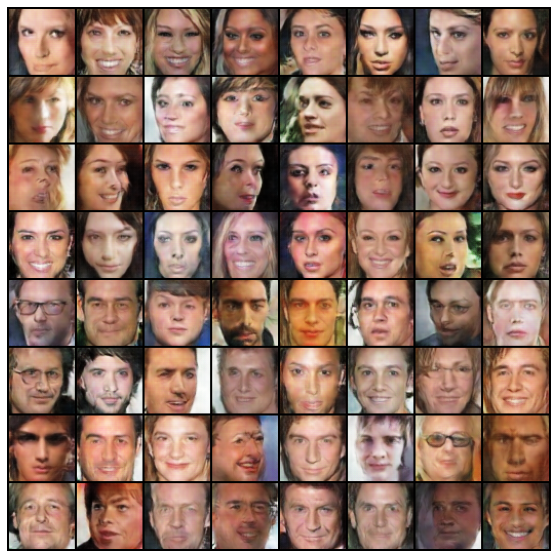

In [ ]:
'v1'
from torch_snippets import Report

discriminator = Discriminator().to(device)
generator = Generator().to(device)
criterion = nn.BCELoss()
d_optimizer = optim.AdamW(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
g_optimizer = optim.AdamW(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
fixed_noise = torch.randn(64, 100, 1, 1, device=device)
fixed_fake_labels = torch.LongTensor([0]*(len(fixed_noise)//2) + [1]*(len(fixed_noise)//2)).to(device)

discriminator.train()
loss = nn.BCELoss()

n_epochs = 25
log = Report(n_epochs)
img_list, iters = [], 0

log = Report(n_epochs)
for epoch in range(n_epochs):
    N = len(dataloader)
    for bx, (images, labels) in enumerate(dataloader):
        #generator.train()
        real_data, real_labels = images.to(device), labels.to(device)
        fake_labels = torch.LongTensor(np.random.randint(0, 2, len(real_data))).to(device)
        fake_data = generator(noise(len(real_data)), fake_labels)
        fake_data = fake_data.detach() # we are not training generator here, just using fake images
        d_loss = discriminator_train_step(real_data, real_labels, fake_data, fake_labels)
        
        fake_labels = torch.LongTensor(np.random.randint(0, 2, len(real_data))).to(device)
        fake_data = generator(noise(len(real_data)), fake_labels).to(device)
        g_loss = generator_train_step(fake_data, fake_labels)

        pos = epoch + (1+bx)/N
        log.record(pos, d_loss=d_loss.detach(), g_loss=g_loss.detach(), end='\r')
    log.report_avgs(epoch+1)
    with torch.no_grad():
        fake = generator(fixed_noise, fixed_fake_labels).detach().cpu()
        imgs = vutils.make_grid(fake, padding=2, normalize=True).permute(1,2,0)
        img_list.append(imgs)
        show(imgs, sz=10)

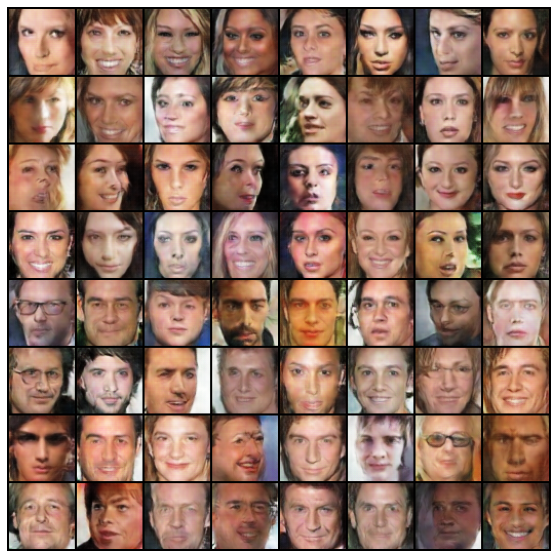

In [ ]:
fake = generator(fixed_noise, fixed_fake_labels).detach().cpu()
imgs = vutils.make_grid(fake, padding=2, normalize=True).permute(1,2,0)
img_list.append(imgs)
show(imgs, sz=10, title='Generated female and male images')